# ДЗ №2

## Загрузка библиотек

In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:
import warnings
warnings.filterwarnings('ignore')

In [3]:
import numpy as np
import scipy
import matplotlib.pyplot as plt
import scipy.stats as stats
import statsmodels
import statsmodels.sandbox.stats.multicomp
import pandas as pd
from statsmodels.stats.weightstats import ztest

import matplotlib.pyplot as plt
import seaborn as sns

from tqdm import tqdm
from sklearn.utils import shuffle
import hashlib
from base64 import b64encode
import collections
import datetime

import plotly.express as px

## Загрузка данных

In [4]:
shop_metrics_new = pd.read_csv('../data/shop_df_metrics_dec.csv').drop(columns='Unnamed: 0')
shop_metrics_old = pd.read_csv('../data/shop_df_metrics_sept.csv').drop(columns='Unnamed: 0')
shop_users_info = pd.read_csv('../data/shop_df_users.csv').drop(columns='Unnamed: 0')

In [5]:
shop_metrics_new.head()

,user_id,group,is_viewed,products_viewed_cnt,price_sum,is_cart_added,is_purchased,cart_added_cnt,purchased_cnt
0,1515915625353230683,A,1,1,339.79,0.0,0.0,0,0
1,1515915625353234047,A,1,9,861.86,0.0,0.0,0,0
2,1515915625353236157,A,1,4,179.60,0.0,0.0,0,0
3,1515915625353294441,B,1,28,4283.04,0.0,0.0,0,0
4,1515915625353386199,B,1,1,20.98,0.0,0.0,0,0


In [6]:
shop_metrics_old.head()

,user_id,group,is_viewed,products_viewed_cnt,price_sum,is_cart_added,is_purchased,cart_added_cnt,purchased_cnt
0,1515915625353226922,B,1,1,76.48,0.0,0.0,0,0
1,1515915625353230067,A,1,1,28.98,0.0,0.0,0,0
2,1515915625353230683,A,1,10,592.21,0.0,0.0,0,0
3,1515915625353230922,A,1,1,274.40,0.0,0.0,0,0
4,1515915625353234047,A,1,14,1857.94,0.0,0.0,0,0


In [7]:
shop_users_info.head()

,user_id,user_age,user_sex
0,1515915625519388267,41,f
1,1515915625519380411,84,m
2,1515915625513238515,41,m
3,1515915625519014356,25,m
4,1515915625510743344,42,m


Посмотрим на графики

In [8]:
px.histogram({'Group A': shop_metrics_old[shop_metrics_old.group == 'A']['cart_added_cnt'], 'Group B': shop_metrics_old[shop_metrics_old.group == 'B']['cart_added_cnt']}, x=['Group A', 'Group B'], barmode='overlay').show()

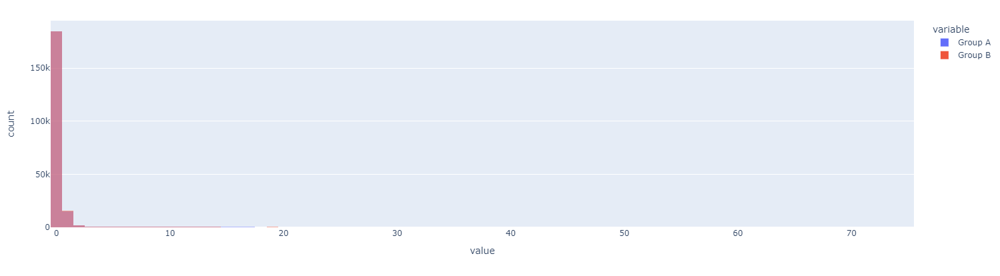

In [9]:
px.histogram({'Group A': shop_metrics_new[shop_metrics_new.group == 'A']['cart_added_cnt'], 'Group B': shop_metrics_new[shop_metrics_new.group == 'B']['cart_added_cnt']}, x=['Group A', 'Group B'], barmode='overlay').show()

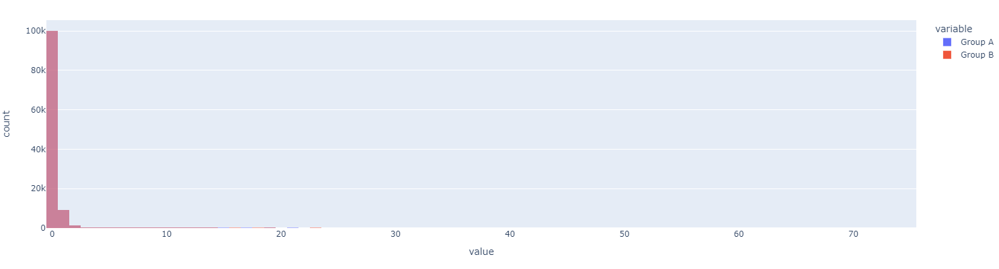

На первый взгляд кажется, что разницы нет, а если и есть, то очень небольшая. Вероятнее всего, потребуется применять что-то мощное для обнаружения эффекта

Зафиксируем гипотезы: H0 - средние в группах одинаковы, H1 - средние различаются. Будем считать, что мы будем отвергать нулевую гипотезу при pvalue < 0.05

## Функции для дальнейшего применения

In [10]:
def salt_generator(salt=None):
    import os
    from base64 import b64encode
    salt = os.urandom(8)
    
    return b64encode(salt).decode('ascii')

In [11]:
def groups_splitter(df, user_salt=None):
    
    if user_salt == None:
        salt = salt_generator()
    else:
        salt = user_salt
    
    df['hash'] = ((df['user_id'].astype(str)) + '#' + salt).apply(lambda x: hashlib.sha256(x.encode('utf-8')).hexdigest())

    df['group'] = ((df['hash'].str.slice(start=-6).apply(int, base=16) % 2).map(lambda x: 'A' if x == 0 else 'B'))

    return df[['user_id', 'group']].drop_duplicates()

In [12]:
def rank_transformation(df_a, df_b, metric):
    df = pd.concat([df_a, df_b], axis = 0)
    df['rank'] = df[metric].rank()
    
    return df

In [13]:
def cuped_transform(df, metrics):

    new_columns = [str(m+'_cuped') for m in metrics]
    df[new_columns] = pd.DataFrame([[0] * len(new_columns)], index=df.index)

    df_cuped = df.fillna(0)
    for m in metrics:
        covariate_column = str(m+'_covariate')
        cuped_column = str(m+'_cuped')
        mean_covariate = df_cuped[covariate_column].mean()

        theta = (df_cuped[m].cov(df_cuped[covariate_column]))/(df_cuped.loc[:,covariate_column].var())
        df_cuped[cuped_column] = df_cuped[m] - (df_cuped[covariate_column] - mean_covariate) * theta

    df.update(df_cuped)

    return df.drop_duplicates()

## Задание 1
(1 балл) Применить ранговую трансформацию (потом t-test) и сравнить с результатами по Манну-Уитни на: 
- метрике cart_added_cnt 

In [14]:
ranked = rank_transformation(shop_metrics_new[shop_metrics_new.group == 'A'], 
                             shop_metrics_new[shop_metrics_new.group == 'B'], 'cart_added_cnt')

In [15]:
ranked.head()

,user_id,group,is_viewed,products_viewed_cnt,price_sum,is_cart_added,is_purchased,cart_added_cnt,purchased_cnt,rank
0,1515915625353230683,A,1,1,339.79,0.0,0.0,0,0,100038.5
1,1515915625353234047,A,1,9,861.86,0.0,0.0,0,0,100038.5
2,1515915625353236157,A,1,4,179.60,0.0,0.0,0,0,100038.5
5,1515915625353400724,A,1,2,103.33,0.0,0.0,0,0,100038.5
7,1515915625353416040,A,1,13,1861.21,0.0,0.0,0,0,100038.5


Чисто ради интереса попробуем применить t-test на оригинальных данных

In [16]:
stats.ttest_ind(shop_metrics_new[shop_metrics_new.group == 'A']['cart_added_cnt'], 
                shop_metrics_new[shop_metrics_new.group == 'B']['cart_added_cnt'])

TtestResult(statistic=-1.3047727178459143, pvalue=0.19197160099583158, df=222519.0)

Теперь на ранговой трансформации

In [17]:
stats.ttest_ind(ranked[ranked.group == 'A']['rank'], ranked[ranked.group == 'B']['rank'])

TtestResult(statistic=-1.2743727811526857, pvalue=0.20253266477504916, df=222519.0)

И критерий Манна-Уитни

In [18]:
stats.mannwhitneyu(shop_metrics_new[shop_metrics_new.group == 'A']['cart_added_cnt'], 
                   shop_metrics_new[shop_metrics_new.group == 'B']['cart_added_cnt'])

MannwhitneyuResult(statistic=6179368188.5, pvalue=0.2025319893087626)

Значения pvalue для t-test с ранговой трансформацией и критерия Манна-Уитни почти одинаковые, они немного больше чем pvalue у обычного классического t-test.   
При этом, все pvalue сейчас указывают на то, что мы не можем отвергнуть нулевую гипотезу

## Задание 2
(3 балла) Реализовать cuped-трансформацию и сравнить мощность t-критерия на: 
- обычной метрике cart_added_cnt
- логарфимированной метрике cart_added_cnt
- метрике cart_added_cnt (а после подвергнуть ранговому преобразованию) 
- В каждом случае фиксировать, на сколько сокращается дисперсия, проверять равны ли средние в группах в ковариате и совпадают ли средние в метрике до и после применения cuped

#### На обычной метрике cart_added_cnt

In [19]:
shop_metrics_all = pd.merge(shop_metrics_new, shop_metrics_old[['user_id', 'cart_added_cnt']], on=['user_id'], how='left')

In [20]:
shop_metrics_all = shop_metrics_all\
                   .rename(columns={'cart_added_cnt_x': 'cart_added_cnt', 'cart_added_cnt_y': 'cart_added_cnt_covariate'})

In [21]:
shop_metrics_all_cuped = cuped_transform(shop_metrics_all.copy(), ['cart_added_cnt'])

In [22]:
print('Mean:')
print(f'метрика_cuped A: {shop_metrics_all_cuped[shop_metrics_all_cuped.group == "A"]["cart_added_cnt_cuped"].mean()}, \
        метрика_cuped B: {shop_metrics_all_cuped[shop_metrics_all_cuped.group == "B"]["cart_added_cnt_cuped"].mean()}')
print(f'метрика без cuped A: {shop_metrics_all_cuped[shop_metrics_all_cuped.group == "A"]["cart_added_cnt"].mean()}, \
        метрика без cuped B: {shop_metrics_all_cuped[shop_metrics_all_cuped.group == "B"]["cart_added_cnt"].mean()}')


Mean:
метрика_cuped A: 0.13638231572657297,         метрика_cuped B: 0.13721028984714181
метрика без cuped A: 0.1350419058398685,         метрика без cuped B: 0.1385521582733813


In [23]:
print('Variance:')
print(f'метрика_cuped A: {shop_metrics_all_cuped[shop_metrics_all_cuped.group == "A"]["cart_added_cnt_cuped"].var()}, \
        метрика_cuped B: {shop_metrics_all_cuped[shop_metrics_all_cuped.group == "B"]["cart_added_cnt_cuped"].var()}')
print(f'метрика без cuped A: {shop_metrics_all_cuped[shop_metrics_all_cuped.group == "A"]["cart_added_cnt"].var()}, \
        метрика без cuped B: {shop_metrics_all_cuped[shop_metrics_all_cuped.group == "B"]["cart_added_cnt"].var()}')


Variance:
метрика_cuped A: 0.01823518359964533,         метрика_cuped B: 0.021495363455396536
метрика без cuped A: 0.3805867322090304,         метрика без cuped B: 0.4247189893567569


Средние не изменились, а дисперсия уменьшилась, что хорошо для нас

In [24]:
stats.ttest_ind(shop_metrics_all_cuped[shop_metrics_all_cuped.group == 'A']['cart_added_cnt_cuped'], 
                shop_metrics_all_cuped[shop_metrics_all_cuped.group == 'B']['cart_added_cnt_cuped'])

TtestResult(statistic=-1.3855896128448428, pvalue=0.16587364048764755, df=222519.0)

pvalue уменьшилось относительно предыдущих вычислений, но мы всё ещё не можем отвергнуть нулевую гипотезу

In [25]:
shop = shop_metrics_new.drop(columns=['group'])

100%|██████████| 100/100 [01:03<00:00,  1.59it/s]

 power: 100.0% , correctness: 96.0%


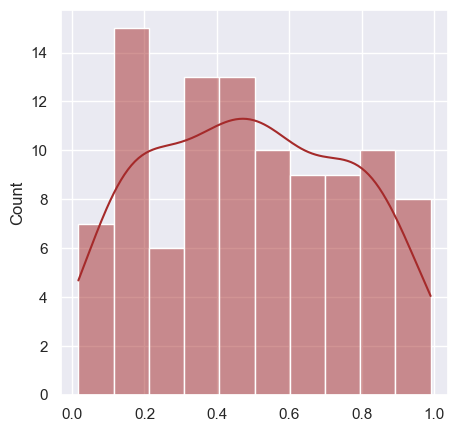

In [26]:
# мощность и корректность для CUPED

correctness = []
power = []

for i in tqdm(range(100)):
    
    new_group = groups_splitter(shop.copy(), user_salt=salt_generator())
    new_df = pd.merge(shop, new_group, how="left", on=['user_id']).drop_duplicates()    
    all_df = pd.merge(new_df, shop_metrics_old[['user_id', 'cart_added_cnt']], on=['user_id'], how='left')
    all_df = all_df.rename(columns={'cart_added_cnt_x': 'cart_added_cnt', 'cart_added_cnt_y': 'cart_added_cnt_covariate'})
    
    cuped_df = cuped_transform(all_df, ['cart_added_cnt'])
    
    vec_a = cuped_df[(cuped_df['group'] == 'A')]['cart_added_cnt_cuped']
    vec_b = cuped_df[(cuped_df['group'] == 'B')]['cart_added_cnt_cuped']

    vec_b_effect = vec_b * 1.05
        
    p_cor, p_power = stats.ttest_ind(vec_a, vec_b)[1], stats.ttest_ind(vec_a, vec_b_effect)[1]
    correctness.append(p_cor)
    power.append(p_power)

correctness = np.array(correctness)
sns.set(rc={'figure.figsize':(5, 5)})
sns.histplot(data=correctness, bins=10, color='brown', kde=True)

power = np.array(power)
    
print(f' power: {(power[power < 0.05].shape[0] / power.shape[0]) * 100}% , correctness: {(1 - (correctness[correctness < 0.05].shape[0] / correctness.shape[0])) * 100}%')

#### На логарфимированной метрике cart_added_cnt

In [27]:
shop_metrics_all = pd.merge(shop_metrics_new, shop_metrics_old[['user_id', 'cart_added_cnt']], on=['user_id'], how='left')
shop_metrics_all = shop_metrics_all.rename(columns={'cart_added_cnt_x': 'cart_added_cnt', 'cart_added_cnt_y': 'cart_added_cnt_covariate'})

In [28]:
shop_metrics_all['cart_added_cnt_ln'] = np.log(shop_metrics_all['cart_added_cnt'] + 1)
shop_metrics_all['cart_added_cnt_ln_covariate'] = np.log(shop_metrics_all['cart_added_cnt_covariate'] + 1)

In [29]:
shop_metrics_all_cuped = cuped_transform(shop_metrics_all.copy(), ['cart_added_cnt_ln'])

In [30]:
print('Mean:')
print(f'метрика_cuped A: {shop_metrics_all_cuped[shop_metrics_all_cuped.group == "A"]["cart_added_cnt_ln_cuped"].mean()}, \
        метрика_cuped B: {shop_metrics_all_cuped[shop_metrics_all_cuped.group == "B"]["cart_added_cnt_ln_cuped"].mean()}')
print(f'метрика без cuped A: {shop_metrics_all_cuped[shop_metrics_all_cuped.group == "A"]["cart_added_cnt_ln"].mean()}, \
        метрика без cuped B: {shop_metrics_all_cuped[shop_metrics_all_cuped.group == "B"]["cart_added_cnt_ln"].mean()}')

Mean:
метрика_cuped A: 0.08034157852348374,         метрика_cuped B: 0.08072086382541542
метрика без cuped A: 0.07974289062640032,         метрика без cuped B: 0.08132020317245879


In [31]:
print('Variance:')
print(f'метрика_cuped A: {shop_metrics_all_cuped[shop_metrics_all_cuped.group == "A"]["cart_added_cnt_ln_cuped"].var()}, \
        метрика_cuped B: {shop_metrics_all_cuped[shop_metrics_all_cuped.group == "B"]["cart_added_cnt_ln_cuped"].var()}')
print(f'метрика без cuped A: {shop_metrics_all_cuped[shop_metrics_all_cuped.group == "A"]["cart_added_cnt_ln"].var()}, \
        метрика без cuped B: {shop_metrics_all_cuped[shop_metrics_all_cuped.group == "B"]["cart_added_cnt_ln"].var()}')

Variance:
метрика_cuped A: 0.002055014378642917,         метрика_cuped B: 0.0017558187333519078
метрика без cuped A: 0.06466232955752058,         метрика без cuped B: 0.06628259108478471


Видим, что изменились и средние, и дисперсия. Дисперсия при этом уменьшилась очень сильно, но мы потеряли интерпретируемость, т.к. изменили средние

In [32]:
stats.ttest_ind(shop_metrics_all_cuped[shop_metrics_all_cuped.group == 'A']['cart_added_cnt_ln_cuped'], 
                shop_metrics_all_cuped[shop_metrics_all_cuped.group == 'B']['cart_added_cnt_ln_cuped'])

TtestResult(statistic=-2.0493551017037106, pvalue=0.040428574068197394, df=222519.0)

Видим, что здесь наблюдаются статзначимые изменения в группах

100%|██████████| 100/100 [01:04<00:00,  1.55it/s]

 power: 100.0% , correctness: 96.0%


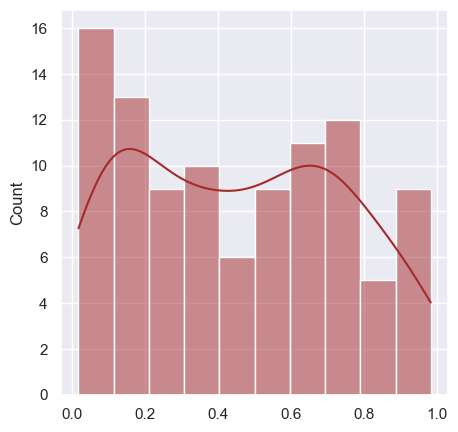

In [33]:
# мощность и корректность для CUPED log

correctness = []
power = []

for i in tqdm(range(100)):
    
    new_group = groups_splitter(shop.copy(), user_salt=salt_generator())
    new_df = pd.merge(shop, new_group, how="left", on=['user_id']).drop_duplicates()    
    all_df = pd.merge(new_df, shop_metrics_old[['user_id', 'cart_added_cnt']], on=['user_id'], how='left')
    all_df = all_df.rename(columns={'cart_added_cnt_x': 'cart_added_cnt', 'cart_added_cnt_y': 'cart_added_cnt_covariate'})
    
    all_df['cart_added_cnt_ln'] = np.log(shop_metrics_all['cart_added_cnt'] + 1)
    all_df['cart_added_cnt_ln_covariate'] = np.log(shop_metrics_all['cart_added_cnt_covariate'] + 1)
    
    cuped_df = cuped_transform(all_df, ['cart_added_cnt_ln'])
    
    vec_a = cuped_df[(cuped_df['group'] == 'A')]['cart_added_cnt_ln_cuped']
    vec_b = cuped_df[(cuped_df['group'] == 'B')]['cart_added_cnt_ln_cuped']

    vec_b_effect = vec_b * 1.05
        
    p_cor, p_power = stats.ttest_ind(vec_a, vec_b)[1], stats.ttest_ind(vec_a, vec_b_effect)[1]
    correctness.append(p_cor)
    power.append(p_power)

correctness = np.array(correctness)
sns.set(rc={'figure.figsize':(5, 5)})
sns.histplot(data=correctness, bins=10, color='brown', kde=True)

power = np.array(power)
    
print(f' power: {(power[power < 0.05].shape[0] / power.shape[0]) * 100}% , correctness: {(1 - (correctness[correctness < 0.05].shape[0] / correctness.shape[0])) * 100}%')

#### На метрике cart_added_cnt + ранговое преобразование

In [34]:
shop_metrics_all = pd.merge(shop_metrics_new, shop_metrics_old[['user_id', 'cart_added_cnt']], on=['user_id'], how='left')

In [35]:
shop_metrics_all = shop_metrics_all\
                   .rename(columns={'cart_added_cnt_x': 'cart_added_cnt', 'cart_added_cnt_y': 'cart_added_cnt_covariate'})

In [36]:
shop_metrics_all_cuped = cuped_transform(shop_metrics_all.copy(), ['cart_added_cnt'])

In [37]:
shop_metrics_all_cuped

,user_id,group,is_viewed,products_viewed_cnt,price_sum,is_cart_added,is_purchased,cart_added_cnt,purchased_cnt,cart_added_cnt_covariate,cart_added_cnt_cuped
0,1515915625353230683,A,1,1,339.79,0.0,0.0,0,0,0,0.132761
1,1515915625353234047,A,1,9,861.86,0.0,0.0,0,0,0,0.132761
2,1515915625353236157,A,1,4,179.60,0.0,0.0,0,0,0,0.132761
3,1515915625353294441,B,1,28,4283.04,0.0,0.0,0,0,0,0.132761
4,1515915625353386199,B,1,1,20.98,0.0,0.0,0,0,0,0.132761
...,...,...,...,...,...,...,...,...,...,...,...
222516,1515915625611023671,B,1,1,32.22,0.0,0.0,0,0,0,0.132761
222517,1515915625611023730,B,1,1,219.94,0.0,0.0,0,0,0,0.132761
222518,1515915625611024014,B,1,1,80.03,0.0,0.0,0,0,0,0.132761
222519,1515915625611024020,B,1,1,64.92,0.0,0.0,0,0,0,0.132761


In [38]:
ranked_cuped = rank_transformation(shop_metrics_all_cuped[shop_metrics_all_cuped.group == 'A'], 
                             shop_metrics_all_cuped[shop_metrics_all_cuped.group == 'B'], 'cart_added_cnt_cuped')

In [39]:
ranked_cuped

,user_id,group,is_viewed,products_viewed_cnt,price_sum,is_cart_added,is_purchased,cart_added_cnt,purchased_cnt,cart_added_cnt_covariate,cart_added_cnt_cuped,rank
0,1515915625353230683,A,1,1,339.79,0.0,0.0,0,0,0,0.132761,100501.5
1,1515915625353234047,A,1,9,861.86,0.0,0.0,0,0,0,0.132761,100501.5
2,1515915625353236157,A,1,4,179.60,0.0,0.0,0,0,0,0.132761,100501.5
5,1515915625353400724,A,1,2,103.33,0.0,0.0,0,0,0,0.132761,100501.5
7,1515915625353416040,A,1,13,1861.21,0.0,0.0,0,0,0,0.132761,100501.5
...,...,...,...,...,...,...,...,...,...,...,...,...
222516,1515915625611023671,B,1,1,32.22,0.0,0.0,0,0,0,0.132761,100501.5
222517,1515915625611023730,B,1,1,219.94,0.0,0.0,0,0,0,0.132761,100501.5
222518,1515915625611024014,B,1,1,80.03,0.0,0.0,0,0,0,0.132761,100501.5
222519,1515915625611024020,B,1,1,64.92,0.0,0.0,0,0,0,0.132761,100501.5


In [40]:
print('Mean:')
print(f'метрика_cuped A: {ranked_cuped[ranked_cuped.group == "A"]["rank"].mean()}, \
        метрика_cuped B: {ranked_cuped[ranked_cuped.group == "B"]["rank"].mean()}')
print(f'метрика без cuped A: {ranked_cuped[ranked_cuped.group == "A"]["cart_added_cnt"].mean()}, \
        метрика без cuped B: {ranked_cuped[ranked_cuped.group == "B"]["cart_added_cnt"].mean()}')

Mean:
метрика_cuped A: 111157.3299691882,         метрика_cuped B: 111364.78283723022
метрика без cuped A: 0.1350419058398685,         метрика без cuped B: 0.1385521582733813


In [41]:
print('Variance:')
print(f'метрика_cuped A: {ranked_cuped[ranked_cuped.group == "A"]["rank"].var()}, \
        метрика_cuped B: {ranked_cuped[ranked_cuped.group == "B"]["rank"].var()}')
print(f'метрика без cuped A: {ranked_cuped[ranked_cuped.group == "A"]["cart_added_cnt"].var()}, \
        метрика без cuped B: {ranked_cuped[ranked_cuped.group == "B"]["cart_added_cnt"].var()}')

Variance:
метрика_cuped A: 1138307738.193268,         метрика_cuped B: 1151768826.5589178
метрика без cuped A: 0.3805867322090304,         метрика без cuped B: 0.4247189893567569


Дисперсия уменьшилась не сильно по сравнению с простой ранговой трансформацией

In [42]:
stats.ttest_ind(ranked_cuped[ranked_cuped.group == 'A']['rank'], 
                ranked_cuped[ranked_cuped.group == 'B']['rank'])

TtestResult(statistic=-1.4459909525623789, pvalue=0.14818114788143422, df=222519.0)

Тест не выявил статзначимых изменений

100%|██████████| 100/100 [01:06<00:00,  1.50it/s]

 power: 100.0% , correctness: 95.0%


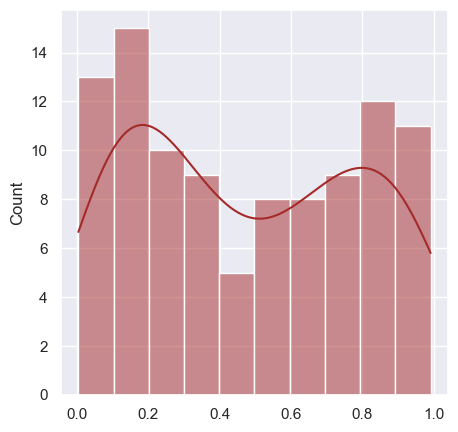

In [43]:
# мощность и корректность для CUPED rank

correctness = []
power = []

for i in tqdm(range(100)):
    
    new_group = groups_splitter(shop.copy(), user_salt=salt_generator())
    new_df = pd.merge(shop, new_group, how="left", on=['user_id']).drop_duplicates()    
    all_df = pd.merge(new_df, shop_metrics_old[['user_id', 'cart_added_cnt']], on=['user_id'], how='left')
    all_df = all_df.rename(columns={'cart_added_cnt_x': 'cart_added_cnt', 'cart_added_cnt_y': 'cart_added_cnt_covariate'})
    
    cuped_df = cuped_transform(all_df, ['cart_added_cnt'])
    cuped_df = rank_transformation(cuped_df[cuped_df.group == 'A'], 
                             cuped_df[cuped_df.group == 'B'], 'cart_added_cnt_cuped')
    
    vec_a = cuped_df[(cuped_df['group'] == 'A')]['rank']
    vec_b = cuped_df[(cuped_df['group'] == 'B')]['rank']

    vec_b_effect = vec_b * 1.05
        
    p_cor, p_power = stats.ttest_ind(vec_a, vec_b)[1], stats.ttest_ind(vec_a, vec_b_effect)[1]
    correctness.append(p_cor)
    power.append(p_power)

correctness = np.array(correctness)
sns.set(rc={'figure.figsize':(5, 5)})
sns.histplot(data=correctness, bins=10, color='brown', kde=True)

power = np.array(power)
    
print(f' power: {(power[power < 0.05].shape[0] / power.shape[0]) * 100}% , correctness: {(1 - (correctness[correctness < 0.05].shape[0] / correctness.shape[0])) * 100}%')

## Задание 3
(2 балла) Реализовать разбивку на бакеты, оценить t-критерием и сравнить с результатом без бакетирования: 
- на логнормальном распределении (сгенерированные данные)
- на метрике cart_added_cnt 

#### На сгенерированном логнормальном распределении

In [44]:
np.random.seed(42)

In [45]:
mu, sigma = 0.3, 1.
data = np.random.lognormal(mu, sigma, 10000000)

In [46]:
df = pd.DataFrame({'user_id': range(len(data)), 'value': data})
df['group'] = np.where(df['user_id'] % 2 == 1, 'A', 'B')

In [47]:
num_buckets = 1000
df['bucket'] = pd.qcut(df['value'], q=num_buckets, labels=False, precision=0)

In [48]:
df

,user_id,value,group,bucket
0,0,2.218240,B,690
1,1,1.175550,A,444
2,2,2.579740,B,741
3,3,6.190587,A,936
4,4,1.068063,B,407
...,...,...,...,...
9999995,9999995,2.524767,A,734
9999996,9999996,0.752004,B,279
9999997,9999997,5.853013,A,928
9999998,9999998,2.571291,B,740


In [49]:
group_A = df[df.group == 'A']
group_B = df[df.group == 'B']

In [50]:
group_A_bucket = group_A.groupby('bucket').agg({'value':'mean'}).reset_index()
group_A_bucket.columns = ['bucket', 'value_A']

group_B_bucket = group_B.groupby('bucket').agg({'value':'mean'}).reset_index()
group_B_bucket.columns = ['bucket', 'value_B']

df_bucket = pd.merge(group_A_bucket, group_B_bucket, on='bucket')

In [51]:
df_bucket

,bucket,value_A,value_B
0,0,0.048001,0.047976
1,1,0.069115,0.069319
2,2,0.081463,0.081450
3,3,0.090828,0.090882
4,4,0.098981,0.098990
...,...,...,...
995,995,18.401011,18.390850
996,996,20.028658,20.026919
997,997,22.397249,22.385831
998,998,26.407762,26.412158


(array([[328., 258., 144.,  85.,  53.,  35.,  24.,  16.,  12.,   9.,   7.,
           6.,   4.,   3.,   2.,   2.,   2.,   2.,   1.,   1.,   1.,   0.,
           1.,   0.,   1.,   0.,   0.,   1.,   0.,   0.,   0.,   0.,   1.,
           0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
           0.,   0.,   0.,   0.,   0.,   1.],
        [328., 258., 144.,  85.,  53.,  35.,  24.,  16.,  12.,   9.,   7.,
           6.,   4.,   3.,   2.,   2.,   2.,   2.,   1.,   1.,   1.,   0.,
           1.,   0.,   1.,   0.,   0.,   1.,   0.,   0.,   0.,   0.,   1.,
           0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
           0.,   0.,   0.,   0.,   0.,   1.]]),
 array([ 0.0479756 ,  0.86346952,  1.67896343,  2.49445735,  3.30995126,
         4.12544518,  4.94093909,  5.75643301,  6.57192692,  7.38742084,
         8.20291475,  9.01840867,  9.83390258, 10.6493965 , 11.46489041,
        12.28038433, 13.09587824, 13.91137216, 14.72686607, 15.54235999,
        16.357

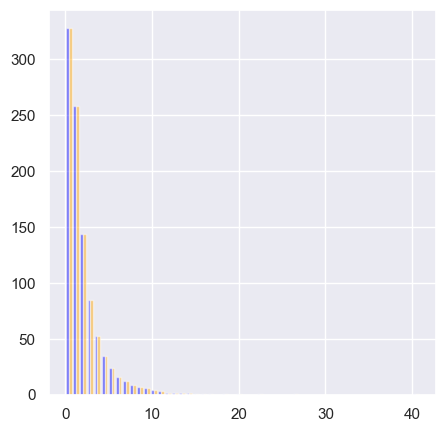

In [52]:
plt.hist([df_bucket.value_A, df_bucket.value_B], color=['blue', 'orange'], alpha=0.5, bins=50)

In [53]:
stats.ttest_ind(df_bucket['value_A'], df_bucket['value_B'])

TtestResult(statistic=0.0009859411455907037, pvalue=0.9992134313352434, df=1998.0)

In [54]:
stats.ttest_ind(group_A['value'], group_B['value'])

TtestResult(statistic=0.6253937537000476, pvalue=0.5317126749809434, df=9999998.0)

В обоих случаях pvalue очень большой, различий в группах нет

#### на метрике cart_added_cnt

In [55]:
shop = shop_metrics_new.copy()

In [56]:
shop

,user_id,group,is_viewed,products_viewed_cnt,price_sum,is_cart_added,is_purchased,cart_added_cnt,purchased_cnt
0,1515915625353230683,A,1,1,339.79,0.0,0.0,0,0
1,1515915625353234047,A,1,9,861.86,0.0,0.0,0,0
2,1515915625353236157,A,1,4,179.60,0.0,0.0,0,0
3,1515915625353294441,B,1,28,4283.04,0.0,0.0,0,0
4,1515915625353386199,B,1,1,20.98,0.0,0.0,0,0
...,...,...,...,...,...,...,...,...,...
222516,1515915625611023671,B,1,1,32.22,0.0,0.0,0,0
222517,1515915625611023730,B,1,1,219.94,0.0,0.0,0,0
222518,1515915625611024014,B,1,1,80.03,0.0,0.0,0,0
222519,1515915625611024020,B,1,1,64.92,0.0,0.0,0,0


пришлось делить так, как указано ниже из-за того что много одинаковых нулевых значений => получается много одинаковых бакетов, и из-за этого pd.qcut сваливался с ошибкой  
Сначала посортим массив по cart_added_cnt, затем будем делить по 222 значения в бакете, чтобы общее число бакетов было примерно 1000

In [57]:
shop = shop.sort_values(by=['cart_added_cnt']).reset_index(drop=True)

In [58]:
shop

,user_id,group,is_viewed,products_viewed_cnt,price_sum,is_cart_added,is_purchased,cart_added_cnt,purchased_cnt
0,1515915625353230683,A,1,1,339.79,0.0,0.0,0,0
1,1515915625597641845,A,1,1,15.94,0.0,0.0,0,0
2,1515915625597642189,B,1,1,21.03,0.0,0.0,0,0
3,1515915625597642196,A,1,1,25.08,0.0,0.0,0,0
4,1515915625597642374,B,1,1,779.90,0.0,0.0,0,0
...,...,...,...,...,...,...,...,...,...
222516,1515915625599634258,B,1,60,8061.90,0.0,0.0,41,21
222517,1515915625592213549,A,1,66,19748.94,0.0,0.0,51,0
222518,1515915625536567608,B,1,151,13556.57,0.0,0.0,56,7
222519,1515915625607553401,A,1,72,15027.87,0.0,0.0,61,0


In [59]:
shop['bucket'] = shop.index // 222

In [60]:
shop

,user_id,group,is_viewed,products_viewed_cnt,price_sum,is_cart_added,is_purchased,cart_added_cnt,purchased_cnt,bucket
0,1515915625353230683,A,1,1,339.79,0.0,0.0,0,0,0
1,1515915625597641845,A,1,1,15.94,0.0,0.0,0,0,0
2,1515915625597642189,B,1,1,21.03,0.0,0.0,0,0,0
3,1515915625597642196,A,1,1,25.08,0.0,0.0,0,0,0
4,1515915625597642374,B,1,1,779.90,0.0,0.0,0,0,0
...,...,...,...,...,...,...,...,...,...,...
222516,1515915625599634258,B,1,60,8061.90,0.0,0.0,41,21,1002
222517,1515915625592213549,A,1,66,19748.94,0.0,0.0,51,0,1002
222518,1515915625536567608,B,1,151,13556.57,0.0,0.0,56,7,1002
222519,1515915625607553401,A,1,72,15027.87,0.0,0.0,61,0,1002


In [61]:
group_A = shop[shop.group == 'A']
group_B = shop[shop.group == 'B']

In [62]:
group_A_bucket = group_A.groupby('bucket').agg({'cart_added_cnt':'mean'}).reset_index()
group_A_bucket.columns = ['bucket', 'value_A']

group_B_bucket = group_B.groupby('bucket').agg({'cart_added_cnt':'mean'}).reset_index()
group_B_bucket.columns = ['bucket', 'value_B']

df_bucket = pd.merge(group_A_bucket, group_B_bucket, on='bucket')

In [63]:
df_bucket

,bucket,value_A,value_B
0,0,0.000000,0.000000
1,1,0.000000,0.000000
2,2,0.000000,0.000000
3,3,0.000000,0.000000
4,4,0.000000,0.000000
...,...,...,...
998,998,3.000000,3.000000
999,999,3.837607,3.819048
1000,1000,4.410000,4.500000
1001,1001,7.413462,7.338983


(array([[901.,   1.,  83.,   0.,  11.,   0.,   0.,   3.,   0.,   1.,   1.,
           0.,   0.,   0.,   0.,   0.,   0.,   0.,   1.,   0.,   0.,   0.,
           0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
           0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
           0.,   1.,   0.,   0.,   0.,   0.],
        [901.,   1.,  82.,   1.,  11.,   0.,   0.,   3.,   0.,   1.,   0.,
           1.,   0.,   0.,   0.,   0.,   0.,   0.,   1.,   0.,   0.,   0.,
           0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
           0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
           0.,   0.,   0.,   0.,   0.,   1.]]),
 array([ 0.        ,  0.40324324,  0.80648649,  1.20972973,  1.61297297,
         2.01621622,  2.41945946,  2.8227027 ,  3.22594595,  3.62918919,
         4.03243243,  4.43567568,  4.83891892,  5.24216216,  5.64540541,
         6.04864865,  6.45189189,  6.85513514,  7.25837838,  7.66162162,
         8.064

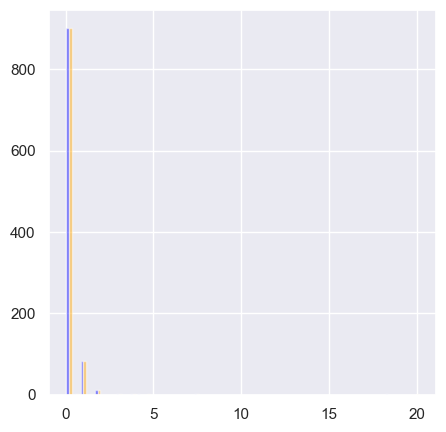

In [64]:
plt.hist([df_bucket.value_A, df_bucket.value_B], color=['blue', 'orange'], alpha=0.5, bins=50)

In [65]:
stats.ttest_ind(df_bucket['value_A'], df_bucket['value_B'])

TtestResult(statistic=-0.05752080207816282, pvalue=0.9541360703870897, df=2004.0)

In [66]:
stats.ttest_ind(group_A['cart_added_cnt'], group_B['cart_added_cnt'])

TtestResult(statistic=-1.304772717845914, pvalue=0.19197160099583171, df=222519.0)

Видим, что при бакетировании pvalue гораздо выше и говорит о том, что разницы между группами нет

In [67]:
shop = shop.groupby("bucket").agg({'cart_added_cnt':'mean'}).reset_index(drop=False)

In [68]:
shop

,bucket,cart_added_cnt
0,0,0.000000
1,1,0.000000
2,2,0.000000
3,3,0.000000
4,4,0.000000
...,...,...
998,998,3.000000
999,999,3.828829
1000,1000,4.459459
1001,1001,7.373874


In [69]:
shop['user_id'] = shop['bucket']

In [70]:
shop


,bucket,cart_added_cnt,user_id
0,0,0.000000,0
1,1,0.000000,1
2,2,0.000000,2
3,3,0.000000,3
4,4,0.000000,4
...,...,...,...
998,998,3.000000,998
999,999,3.828829,999
1000,1000,4.459459,1000
1001,1001,7.373874,1001


100%|██████████| 1000/1000 [00:05<00:00, 179.88it/s]


 power: 3.0% , correctness: 96.8%


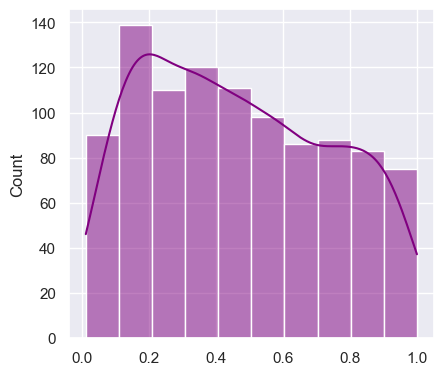

In [71]:
correctness = []
power = []

for i in tqdm(range(1000)): 
    new_group = groups_splitter(shop.copy(), user_salt=salt_generator())
    new_df = pd.merge(shop, new_group, how="left", on=['user_id']).drop_duplicates()
    
    vec_a = new_df[(new_df['group'] == 'A')]['cart_added_cnt']
    vec_b = new_df[(new_df['group'] == 'B')]['cart_added_cnt']
    
    vec_b_effect = vec_b * 1.05
    
    p_cor, p_power = stats.ttest_ind(vec_a, vec_b)[1], stats.ttest_ind(vec_a, vec_b_effect)[1]
    correctness.append(p_cor)
    power.append(p_power)

correctness = np.array(correctness)
sns.set(rc={'figure.figsize':(4.7,4.27)})
sns.histplot(data=correctness, bins=10, color='purple', kde=True)

power = np.array(power)
print(f' power: {(power[power < 0.05].shape[0] / power.shape[0]) * 100}% , correctness: {(1 - (correctness[correctness < 0.05].shape[0] / correctness.shape[0])) * 100}%')

Т.к. было очень много бакетов с нулями, то, при докидывании 5%, эффекта практически не было, только на нескольких значениях. Поэтому мощность очень сильно просела. Неравномерное распределение pvalue также указывает на то, что что-то пошло не так.   
На таких данных наверное не следует применять этот метод / или ошибка в реализации

## Задание 4
(2 балла) Реализовать постстратификацию на данных shop_metrics_old для метрики cart_added_cnt: 
- на сочетании пола и возраста (возраст разбить на подгруппы: 18-24, 25-45, 46-60, 61-75, 76+)
подсчитать результаты для случая без постстратификации и с постстратификацией
- проверить мощность и корректность t-критерия для постстратифицированного случая 

#### Постстратификация на сочетании пола и возраста

In [72]:
shop_metrics_new = pd.read_csv('../data/shop_df_metrics_dec.csv').drop(columns='Unnamed: 0')
shop_metrics_old = pd.read_csv('../data/shop_df_metrics_sept.csv').drop(columns='Unnamed: 0')
shop_users_info = pd.read_csv('../data/shop_df_users.csv').drop(columns='Unnamed: 0')

In [73]:
merged_data = pd.merge(shop_metrics_old, shop_users_info, on='user_id')

bins = [18, 25, 46, 61, 76, 200]
labels = ['18-24', '25-45', '46-60', '61-75', '76+']
merged_data['stratum'] = pd.cut(merged_data['user_age'], bins=bins, labels=labels, right=False).astype(str) + '_' + merged_data['user_sex']

In [74]:
merged_data

,user_id,group,is_viewed,products_viewed_cnt,price_sum,is_cart_added,is_purchased,cart_added_cnt,purchased_cnt,user_age,user_sex,stratum
0,1515915625353226922,B,1,1,76.48,0.0,0.0,0,0,55,f,46-60_f
1,1515915625353230067,A,1,1,28.98,0.0,0.0,0,0,58,m,46-60_m
2,1515915625353230683,A,1,10,592.21,0.0,0.0,0,0,23,f,18-24_f
3,1515915625353230922,A,1,1,274.40,0.0,0.0,0,0,33,m,25-45_m
4,1515915625353234047,A,1,14,1857.94,0.0,0.0,0,0,26,f,25-45_f
...,...,...,...,...,...,...,...,...,...,...,...,...
406858,1515915625611023671,B,1,1,32.22,0.0,0.0,0,0,76,m,76+_m
406859,1515915625611023730,B,1,1,219.94,0.0,0.0,0,0,34,m,25-45_m
406860,1515915625611024014,B,1,1,80.03,0.0,0.0,0,0,62,m,61-75_m
406861,1515915625611024020,B,1,1,64.92,0.0,0.0,0,0,48,f,46-60_f


In [75]:
merged_data.groupby('group')['stratum'].value_counts()

group  stratum
A      25-45_m    38432
       46-60_m    27321
       61-75_m    27001
       25-45_f    25540
       46-60_f    18336
       61-75_f    17939
       76+_m      16249
       18-24_m    12890
       76+_f      11125
       18-24_f     8503
B      25-45_m    38490
       46-60_m    27283
       61-75_m    27249
       25-45_f    25439
       61-75_f    18246
       46-60_f    18111
       76+_m      16362
       18-24_m    12816
       76+_f      11082
       18-24_f     8449
Name: count, dtype: int64

Без стратификации:

In [76]:
stats.ttest_ind(merged_data[merged_data.group == 'A']['cart_added_cnt'], 
                merged_data[merged_data.group == 'B']['cart_added_cnt'])

TtestResult(statistic=-0.7331870372707812, pvalue=0.4634447828246868, df=406861.0)

Эффекта без стратификации не заметно

In [77]:
(merged_data[merged_data.group == 'B']['cart_added_cnt'].mean() - merged_data[merged_data.group == 'A']['cart_added_cnt'].mean()) \
        /merged_data[merged_data.group == 'A']['cart_added_cnt'].mean() * 100

1.1242734540045785

Из ячейки выше видим, что эффект в группе B предположительно около 1%

In [78]:
print(merged_data[merged_data.group == 'A']['cart_added_cnt'].std(), 
      merged_data[merged_data.group == 'B']['cart_added_cnt'].std())

0.576689119780438 0.5987645651973791


In [79]:
unique_strats = merged_data['stratum'].unique()
unique_strats

array(['46-60_f', '46-60_m', '18-24_f', '25-45_m', '25-45_f', '76+_m',
       '61-75_m', '61-75_f', '76+_f', '18-24_m'], dtype=object)

In [80]:
N = merged_data['user_id'].nunique()
strats_weights = {}

mean_a_dict = {}
mean_b_dict = {}
std_a_dict = {}
std_b_dict = {}

for strat in unique_strats:
    strats_weights[strat] = merged_data[merged_data['stratum'] == strat]['user_id'].nunique() / N
    
    for group in ['A', 'B']:
        mask = (merged_data['group'] == group) & (merged_data['stratum'] == strat)
        mean_key = f"mean_{group}_{strat}"
        std_key = f"std_{group}_{strat}"
        
        mean_dict = mean_a_dict if group == 'A' else mean_b_dict
        std_dict = std_a_dict if group == 'A' else std_b_dict
        
        mean_dict[strat] = merged_data[mask]['cart_added_cnt'].mean() * strats_weights[strat]
        std_dict[strat] = merged_data[mask]['cart_added_cnt'].std()**2 * strats_weights[strat]

In [81]:
n_a = len(merged_data[merged_data['group'] == 'A'])
n_b = len(merged_data[merged_data['group'] == 'B'])

mean_a = sum(mean_a_dict.values())
mean_b = sum(mean_b_dict.values())
std_a = sum(std_a_dict.values()) / N
std_b = sum(std_b_dict.values()) / N

print(f'effect: {(mean_b - mean_a)/mean_a*100}, std_a: {std_a}, std_b: {std_b}')

stats.ttest_ind_from_stats(mean_a, std_a, n_a, mean_b, std_b, n_b)

effect: 1.123890989435155, std_a: 8.179175411681481e-07, std_b: 8.814427810322827e-07


Ttest_indResult(statistic=-506738.43658293755, pvalue=0.0)

Мы нашли очень сильное различие в группах с pvalue=0. Это странно, возможно где-то была ошибка, но на семинаре тоже такое было. Без стратификации эффект мы не нашли

In [82]:
mean_a_dict

{'46-60_f': 0.010376801327042783,
 '46-60_m': 0.01606302821889703,
 '18-24_f': 0.004767749264839279,
 '25-45_m': 0.023844180704164466,
 '25-45_f': 0.014629512733551306,
 '76+_m': 0.009653395650210655,
 '61-75_m': 0.0158912381593521,
 '61-75_f': 0.010996226880258649,
 '76+_f': 0.006647846318365675,
 '18-24_m': 0.00733761953297165}

In [83]:
mean_b_dict

{'46-60_f': 0.01105969011197583,
 '46-60_m': 0.016567471064537615,
 '18-24_f': 0.005281495418414885,
 '25-45_m': 0.023356350324988794,
 '25-45_f': 0.014884612736357989,
 '76+_m': 0.00943976636757534,
 '61-75_m': 0.015815114068872982,
 '61-75_f': 0.010445635821328257,
 '76+_f': 0.007555251214039389,
 '18-24_m': 0.007153214032975785}

In [84]:
strats_weights

{'46-60_f': 0.08958052219051622,
 '46-60_m': 0.1342073376050415,
 '18-24_f': 0.04166513052305076,
 '25-45_m': 0.18906118275684936,
 '25-45_f': 0.12529770463276335,
 '76+_m': 0.08015228713350686,
 '61-75_m': 0.13333726586099007,
 '61-75_f': 0.08893657078672673,
 '76+_f': 0.05458102604562224,
 '18-24_m': 0.06318097246493291}

#### мощность и корректность t-критерия для постстратифицированного случая 

In [85]:
merged_data = merged_data.drop(['group'], axis=1)

100%|██████████| 100/100 [02:40<00:00,  1.61s/it]

 power: 100.0% , correctness: 0.0%


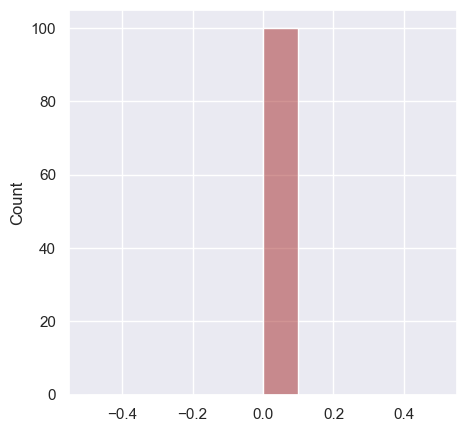

In [86]:
correctness = []
power = []

for i in tqdm(range(100)):
    
    # бьём на группы
    new_group = groups_splitter(merged_data.copy(), user_salt=salt_generator())
    new_df = pd.merge(merged_data, new_group, how="left", on=['user_id']).drop_duplicates()
    
    mean_a_dict = {}
    mean_b_dict = {}
    mean_b_effect_dict = {}
    std_a_dict = {}
    std_b_dict = {}
    std_b_effect_dict = {}
    
    for strat in unique_strats:
        
        mask_a = (new_df['group'] == 'A') & (new_df['stratum'] == strat)
        mask_b = (new_df['group'] == 'B') & (new_df['stratum'] == strat)
        
        vec_a = new_df[mask_a]['cart_added_cnt']
        vec_b = new_df[mask_b]['cart_added_cnt']
        vec_b_effect = new_df[mask_b]['cart_added_cnt']*1.05
        
        mean_a_dict[strat] = vec_a.mean() * strats_weights[strat]
        std_a_dict[strat] = vec_a.std()**2 * strats_weights[strat]
        
        mean_b_dict[strat] = vec_b.mean() * strats_weights[strat]
        std_b_dict[strat] = vec_b.std()**2 * strats_weights[strat]
        
        mean_b_effect_dict[strat] = vec_b_effect.mean() * strats_weights[strat]
        std_b_effect_dict[strat] = vec_b_effect.std()**2 * strats_weights[strat]
            
            
    n_a = len(new_df[new_df['group'] == 'A'])
    n_b = len(new_df[new_df['group'] == 'B'])
    n_b_effect = n_b

    mean_a = sum(mean_a_dict.values())
    mean_b = sum(mean_b_dict.values())
    mean_b_effect = sum(mean_b_effect_dict.values())
    
    std_a = sum(std_a_dict.values()) / N
    std_b = sum(std_b_dict.values()) / N
    std_b_effect = sum(std_b_effect_dict.values()) / N

    p_cor, p_power = stats.ttest_ind_from_stats(mean_a, std_a, n_a, mean_b, std_b, n_b)[1], stats.ttest_ind_from_stats(mean_a, std_a, n_a, mean_b_effect, std_b_effect, n_b_effect)[1]
    correctness.append(p_cor)
    power.append(p_power)
    
correctness = np.array(correctness)
sns.set(rc={'figure.figsize':(5, 5)})
sns.histplot(data=correctness, bins=10, color='brown', kde=True)

power = np.array(power)
    
print(f' power: {(power[power < 0.05].shape[0] / power.shape[0]) * 100}% , correctness: {(1 - (correctness[correctness < 0.05].shape[0] / correctness.shape[0])) * 100}%')

In [87]:
correctness

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])

Видим, что везде в correctness получилось pvalue=0. Скорее всего где-то была допущена ошибка в реализации, т.к. эффекта в этих случаях не было, а на группы была случайная разбивка